# Implementing Conditional GANs 

* The cleaned Fashion Product Images dataset is loaded and used to train the cGAN.

* An implementation of cGAN will be carried out using only one feature (subCategory) with 3 lables (Topwear, Watches, Shoes). 

### Step 1: Import the needed libraries 


In [1]:
from keras import backend as K
import tensorflow as tf
from keras.layers import Input, Dense, Reshape, Flatten
from keras.layers import BatchNormalization, Activation, Embedding, multiply
from keras.layers import MaxPooling2D, UpSampling2D, Dropout
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.optimizers import Adam, RMSprop
from keras.models import Model, Sequential
from keras.initializers import RandomNormal
from keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator  
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger
from tensorflow.keras.layers import concatenate

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math   

from tqdm import tqdm
initializer = RandomNormal(mean=0.0, stddev=0.01, seed=None)
%matplotlib inline

### Step 2: Data Loading
The data used in this notebook is the cleaned one with around 14000 images 

In [2]:
# load Fashion Product Images dataset
width=100
batch_size=100 # batch size of image generator = batch size of GAN
df_features=pd.read_csv('df_shoes.csv')
path = '/home/group6/G.Deep Learning/Project/Shoes-dataset'
    
Img_generator=ImageDataGenerator(rescale=1./255)
train_gen=Img_generator.flow_from_directory(path, classes=[''], target_size=(width,width),batch_size=batch_size,shuffle=False)

Found 28701 images belonging to 1 classes.


In [3]:
df_features.head()

,CID,Category,SubCategory,HeelHeight,Closure,Gender,Material,ToeStyle
0,100627.255.jpg,Shoes,Flats,Flat,Lace up,Men,Leather,Round Toe
1,100627.72.jpg,Shoes,Flats,Flat,Lace up,Men,Leather,Round Toe
2,100657.216.jpg,Shoes,Flats,Flat,Lace up,Men,Leather,Round Toe
3,100657.72.jpg,Shoes,Flats,Flat,Lace up,Men,Leather,Round Toe
4,101026.3.jpg,Shoes,Boots,Low,Pull-on,Men,Leather,Closed Toe


Since we are dealing only with one feature (subCategory) with only three labels: (Topwear, Watches, Shoes) we will change the encoding of these labels to (0, 1, 2) respectivaly and use the coded classes as int labels in the following code.  

In [4]:
df_features['Gender'].unique()

array(['Men', 'Women'], dtype=object)

In [5]:
df_selected_features = pd.get_dummies(df_features['Gender'])
df_selected_features = df_selected_features.rename(columns = {'Men': 'l1', 'Women': 'l2'}, inplace = False)
df_selected_features['id'] = df_features['CID']
df_selected_features.head()

,l1,l2,id
0,1,0,100627.255.jpg
1,1,0,100627.72.jpg
2,1,0,100657.216.jpg
3,1,0,100657.72.jpg
4,1,0,101026.3.jpg


In [6]:
img_size = (width, width, 3)
latent_size = 100
num_labels = 2
num_batches = math.floor(14409/batch_size)
num_batches

144

In [7]:
train_gen.filenames

['100627.255.jpg',
 '100627.72.jpg',
 '100657.216.jpg',
 '100657.72.jpg',
 '101026.3.jpg',
 '101178.238499.jpg',
 '101178.68022.jpg',
 '101182.3.jpg',
 '101182.381.jpg',
 '101186.3.jpg',
 '101191.20.jpg',
 '101191.238499.jpg',
 '101191.239309.jpg',
 '101191.239312.jpg',
 '101191.3.jpg',
 '101191.598.jpg',
 '101191.65553.jpg',
 '101191.81355.jpg',
 '101192.665.jpg',
 '101430.106.jpg',
 '101430.231.jpg',
 '101430.352.jpg',
 '101430.594.jpg',
 '101430.691.jpg',
 '101430.84351.jpg',
 '101434.299742.jpg',
 '101434.299743.jpg',
 '101434.299744.jpg',
 '103888.609.jpg',
 '103888.72.jpg',
 '103900.1201.jpg',
 '103902.27143.jpg',
 '104002.1257.jpg',
 '104002.3.jpg',
 '104010.1267.jpg',
 '104011.1269.jpg',
 '104011.1270.jpg',
 '104018.1277.jpg',
 '104025.1285.jpg',
 '104025.1286.jpg',
 '104027.1285.jpg',
 '104035.1292.jpg',
 '104035.1293.jpg',
 '104038.1288.jpg',
 '104670.1611.jpg',
 '104670.1626.jpg',
 '104670.3.jpg',
 '104705.130551.jpg',
 '104705.15.jpg',
 '104705.72.jpg',
 '104708.3.jpg',
 '1

### Step 3: cGAN Implementation
Using only one feature (subCategory) with 3 lables (Topwear, Watches, Shoes). 
The origional code can be found [here](https://www.kaggle.com/bothmena/conditional-gan-keras-implementation)

### Generator 

In [8]:
def build_generator(inputs, labels, image_size):
    """Build a Generator Model
    Inputs are concatenated before Dense layer.
    Stack of BN-ReLU-Conv2DTranpose to generate fake images.
    Output activation is sigmoid instead of tanh in orig DCGAN.
    Sigmoid converges easily.
    Arguments:
        inputs (Layer): Input layer of the generator (the z-vector)
        labels (Layer): Input layer for one-hot vector to condition
            the inputs
        image_size: Target size of one side (assuming square image)
    Returns:
        generator (Model): Generator Model
    """
    image_resize = image_size // 4
    # network parameters
    kernel_size = 5
    layer_filters = [128, 64, 32, 3]

    # simply concatenate the one-hot-encoded label with the
    # inputs. axis = 1
    y_labels = Dense(latent_size)(labels)
    x = concatenate([inputs, y_labels], axis=1)
    
    # note that the starting size did not change, just the input size x.
    x = Dense(image_resize * image_resize * layer_filters[0])(x)
    x = Reshape((image_resize, image_resize, layer_filters[0]))(x)

    for filters in layer_filters:
        # first two convolution layers use strides = 2
        # the last two use strides = 1
        if filters > layer_filters[-2]:
            strides = 2
        else:
            strides = 1
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Conv2DTranspose(filters=filters,
                            kernel_size=kernel_size,
                            strides=strides,
                            padding='same')(x)

    x = Activation('sigmoid')(x)
    # input is conditioned by labels
    generator = Model([inputs, labels], x, name='generator')
    generator.summary()
    return generator

### Discriminator

In [9]:
def build_discriminator(inputs, labels, image_size):
    """Build a Discriminator Model
    Inputs are concatenated after Dense layer.
    Stack of LeakyReLU-Conv2D to discriminate real from fake.
    The network does not converge with BN so it is not used here
    unlike in DCGAN paper.
    Arguments:
        inputs (Layer): Input layer of the discriminator (the image)
        labels (Layer): Input layer for one-hot vector to condition
            the inputs
        image_size: Target size of one side (assuming square image)
    Returns:
        discriminator (Model): Discriminator Model
    """
    kernel_size = 5
    layer_filters = [32, 64, 128, 256, 512]

    x = inputs
    y = Dense(image_size * image_size * 3)(labels)
    y = Reshape((image_size, image_size, 3))(y)
    x = concatenate([x, y])

    for filters in layer_filters:
        # first 3 convolution layers use strides = 2
        # last one uses strides = 1
        if filters == layer_filters[-1]:
            strides = 1
        else:
            strides = 2
        x = LeakyReLU(alpha=0.2)(x)
        x = Conv2D(filters=filters,
                   kernel_size=kernel_size,
                   strides=strides,
                   padding='same')(x)

    x = Flatten()(x)
    x = Dense(1)(x)
    x = Activation('sigmoid')(x)
    # input is conditioned by labels
    discriminator = Model([inputs, labels], x, name='discriminator')
    discriminator.summary()
    return discriminator

### Building the model

In [10]:
# img_size=(100,100,3)
# width=100

lables_shape = (num_labels, )

labels = Input(shape=lables_shape, name='labels')
inputs = Input(shape=img_size, name='image')

disc = build_discriminator(inputs, labels, width)
disc.compile(loss='binary_crossentropy', 
                      optimizer=Adam(0.0002, beta_1=0.5), 
                      metrics=['accuracy']) 


z_inputs = (latent_size, )
z_inputs = Input(shape=z_inputs, name='noise')
gen = build_generator(z_inputs, labels, width)

z = Input(shape=(latent_size,))
label = Input(shape=(num_labels,))

img = gen([z, label])
prediction = disc([img, label])

# Conditional (Conditional) GAN model with fixed discriminator to train the generator
cgan = Model([z, label], prediction)
cgan.compile(loss='binary_crossentropy', 
                      optimizer=Adam(0.0002, beta_1=0.5), 
                      metrics=['accuracy']) 

Model: "discriminator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
labels (InputLayer)             [(None, 2)]          0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 30000)        90000       labels[0][0]                     
__________________________________________________________________________________________________
image (InputLayer)              [(None, 100, 100, 3) 0                                            
__________________________________________________________________________________________________
reshape (Reshape)               (None, 100, 100, 3)  0           dense[0][0]                      
______________________________________________________________________________________

### Outputting sample images

In [11]:
np.eye(num_labels)


array([[1., 0.],
       [0., 1.]])

In [12]:
# predict 10 images
def plot_images(generator,
                noise_input,
                show=False,
                file_name="images/cGAN/Latent100LatentModified/Epoch_1.png"):
    z = np.random.normal(0, 1, size=(10, latent_size))
    noise_class = np.eye(num_labels)[np.random.choice(num_labels, 10)]
    gen_imgs = generator.predict([z, noise_class])
    n = 10  # how many digits we will display
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # display original
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(gen_imgs[i].reshape(100, 100, 3)) #Draw the first 10 img in the first batch
#         plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.savefig(file_name)    
    plt.show()

### Training

In [13]:
f = df_selected_features.loc[:, df_selected_features.columns != 'id'].to_numpy()
f

array([[1, 0],
       [1, 0],
       [1, 0],
       ...,
       [0, 1],
       [0, 1],
       [1, 0]], dtype=uint8)

In [14]:
accuracies = []
losses = []
def train(train_gen, y_train, epochs, generator_batch_size, sample_interval=1, ite_to_save=100):
    
    real = np.ones(shape=(generator_batch_size, 1))
    fake = np.zeros(shape=(generator_batch_size, 1))
    
    for epoch in tqdm(range(epochs)):
        train_gen.reset() #To insure that we start again from the same batch (0)
        for batch in range(num_batches):
            #load current batch
            x_train = train_gen.next()
            train_size=(x_train[0].shape)[0] #the same as the origional batch size = 100
            batch_size=train_size
            
            # extracting ids of current batch
            idx = (train_gen.batch_index - 1) * generator_batch_size  
            ids_currentBatch=train_gen.filenames[idx : idx + (batch_size)]  
            
            ids_currentBatch=[s.replace('images/', '') for s in ids_currentBatch] # extract image id 
            ids_currentBatch=np.array(ids_currentBatch)
            if(epoch == 0 and batch==0): #Debugging
                print(ids_currentBatch)
                
            real_images=x_train[0][0:batch_size]   
            
            # get corresponding full features 
            df_features_currentBatch=y_train.loc[y_train['id'].isin(ids_currentBatch)]
            
#             labels = df_features_currentBatch['subCategory'] #The labels here are 0, 1 and 2
            #Select all the labels execpt the id
            labels = df_features_currentBatch.loc[:, df_features_currentBatch.columns != 'id'].to_numpy()
    
            z = np.random.normal(0, 1, size=(batch_size, latent_size))
            gen_imgs = gen.predict([z, labels])
        
            d_loss_real = disc.train_on_batch([real_images, labels], real)
            d_loss_fake = disc.train_on_batch([gen_imgs, labels], fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        
            z = np.random.normal(0, 1, size=(batch_size, latent_size))
            labels = np.eye(num_labels)[np.random.choice(num_labels, batch_size)]
        
            g_loss = cgan.train_on_batch([z, labels], real)
            
#         if epoch % sample_interval == 0:
        print('{} [D loss: {}, accuracy: {:.2f}] [G loss: {}, G accuracy: {:.2f}]'.format(epoch, d_loss[0], 100 * d_loss[1], g_loss[0], 100 * g_loss[1]))
        
        losses.append((d_loss[0], g_loss))
        accuracies.append(d_loss[1])
            
        if epoch % ite_to_save == 0:    
            plot_images(gen,
                z,
                show=True,
                file_name="images/cGAN/Latent100LatentModified/Epoch_{}.png".format(epoch))
            disc.save('cGANModels/Latent100/dcdisc_{}.h5'.format(epoch))  
            gen.save('cGANModels/Latent100/dcgen_{}.h5'.format(epoch))  
            cgan.save('cGANModels/Latent100/dcGAN_{}.h5'.format(epoch))     
    

### Start Training 

  0%|          | 0/201 [00:00<?, ?it/s]

['100627.255.jpg' '100627.72.jpg' '100657.216.jpg' '100657.72.jpg'
 '101026.3.jpg' '101178.238499.jpg' '101178.68022.jpg' '101182.3.jpg'
 '101182.381.jpg' '101186.3.jpg' '101191.20.jpg' '101191.238499.jpg'
 '101191.239309.jpg' '101191.239312.jpg' '101191.3.jpg' '101191.598.jpg'
 '101191.65553.jpg' '101191.81355.jpg' '101192.665.jpg' '101430.106.jpg'
 '101430.231.jpg' '101430.352.jpg' '101430.594.jpg' '101430.691.jpg'
 '101430.84351.jpg' '101434.299742.jpg' '101434.299743.jpg'
 '101434.299744.jpg' '103888.609.jpg' '103888.72.jpg' '103900.1201.jpg'
 '103902.27143.jpg' '104002.1257.jpg' '104002.3.jpg' '104010.1267.jpg'
 '104011.1269.jpg' '104011.1270.jpg' '104018.1277.jpg' '104025.1285.jpg'
 '104025.1286.jpg' '104027.1285.jpg' '104035.1292.jpg' '104035.1293.jpg'
 '104038.1288.jpg' '104670.1611.jpg' '104670.1626.jpg' '104670.3.jpg'
 '104705.130551.jpg' '104705.15.jpg' '104705.72.jpg' '104708.3.jpg'
 '104710.3.jpg' '104712.215.jpg' '104712.835.jpg' '104717.15.jpg'
 '104717.72.jpg' '104719.1

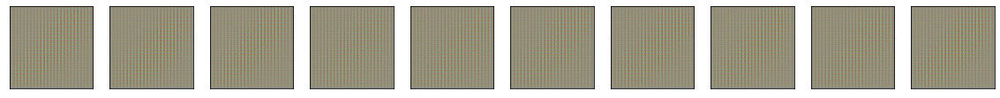

  1%|          | 2/201 [02:12<3:35:49, 65.07s/it]

1 [D loss: 1.0288342304320963e-05, accuracy: 100.00] [G loss: 1.61485195349087e-06, G accuracy: 100.00]


  1%|▏         | 3/201 [03:12<3:25:59, 62.42s/it]

2 [D loss: 23.274297715399793, accuracy: 50.00] [G loss: 1227.7608642578125, G accuracy: 0.00]


  2%|▏         | 4/201 [04:11<3:20:39, 61.11s/it]

3 [D loss: 0.010316672385670245, accuracy: 100.00] [G loss: 0.03989521041512489, G accuracy: 100.00]


  2%|▏         | 5/201 [05:10<3:17:34, 60.48s/it]

4 [D loss: 0.003944783675251529, accuracy: 100.00] [G loss: 0.003260622266680002, G accuracy: 100.00]
5 [D loss: 0.00230771534552332, accuracy: 100.00] [G loss: 0.002381111029535532, G accuracy: 100.00]


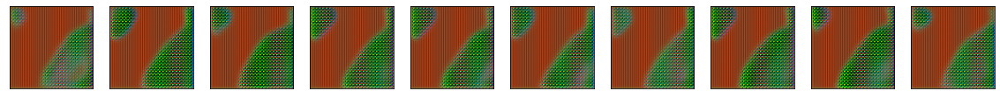

  3%|▎         | 7/201 [07:10<3:14:20, 60.10s/it]

6 [D loss: 0.0012708859919143833, accuracy: 100.00] [G loss: 0.0008086457382887602, G accuracy: 100.00]


  4%|▍         | 8/201 [08:09<3:12:15, 59.77s/it]

7 [D loss: 0.010903821611464082, accuracy: 100.00] [G loss: 0.006783891469240189, G accuracy: 100.00]


  4%|▍         | 9/201 [09:08<3:10:53, 59.65s/it]

8 [D loss: 0.018293676897883415, accuracy: 100.00] [G loss: 0.016620131209492683, G accuracy: 100.00]


  5%|▍         | 10/201 [10:08<3:09:47, 59.62s/it]

9 [D loss: 0.5088685449009063, accuracy: 72.50] [G loss: 3.8484597206115723, G accuracy: 0.00]
10 [D loss: 0.0017326856936534796, accuracy: 100.00] [G loss: 0.004036222118884325, G accuracy: 100.00]


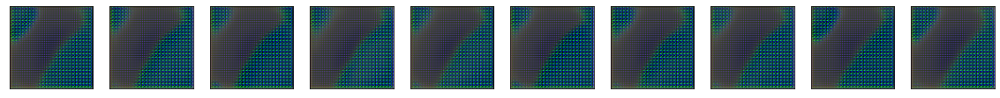

  6%|▌         | 12/201 [12:08<3:08:22, 59.80s/it]

11 [D loss: 0.0008762147699599154, accuracy: 100.00] [G loss: 0.0025856324937194586, G accuracy: 100.00]


  6%|▋         | 13/201 [13:07<3:06:56, 59.66s/it]

12 [D loss: 0.1722490325337276, accuracy: 99.50] [G loss: 1.5963599681854248, G accuracy: 0.00]


  7%|▋         | 14/201 [14:07<3:05:37, 59.56s/it]

13 [D loss: 0.0020719021558761597, accuracy: 100.00] [G loss: 0.0029661201406270266, G accuracy: 100.00]


  7%|▋         | 15/201 [15:06<3:04:33, 59.54s/it]

14 [D loss: 0.11099866032600403, accuracy: 100.00] [G loss: 4.981651306152344, G accuracy: 0.00]
15 [D loss: 1.2099614143371582, accuracy: 50.00] [G loss: 8.080342292785645, G accuracy: 0.00]


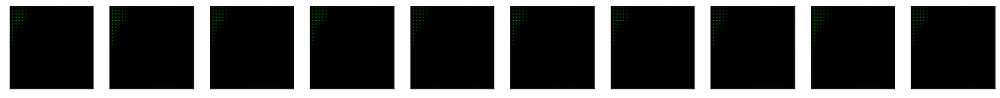

  8%|▊         | 17/201 [17:05<3:02:20, 59.46s/it]

16 [D loss: 1.2709768133778443e-12, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


  9%|▉         | 18/201 [18:04<3:00:41, 59.24s/it]

17 [D loss: 4.686380124819434e-26, accuracy: 100.00] [G loss: 4.937423828620634e-14, G accuracy: 100.00]


  9%|▉         | 19/201 [19:03<2:59:34, 59.20s/it]

18 [D loss: 0.1854085922241211, accuracy: 98.00] [G loss: 0.10862216353416443, G accuracy: 97.00]


 10%|▉         | 20/201 [20:02<2:58:23, 59.14s/it]

19 [D loss: 0.10493848472833633, accuracy: 97.00] [G loss: 0.2539151906967163, G accuracy: 95.00]
20 [D loss: 0.08408566564321518, accuracy: 98.50] [G loss: 1.1973190564842341e-34, G accuracy: 100.00]


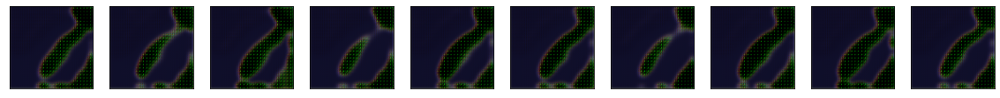

 11%|█         | 22/201 [22:01<2:56:42, 59.23s/it]

21 [D loss: 0.00088077801046893, accuracy: 100.00] [G loss: 1.8254372236015115e-08, G accuracy: 100.00]


 11%|█▏        | 23/201 [23:00<2:55:55, 59.30s/it]

22 [D loss: 0.003485817927867174, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 12%|█▏        | 24/201 [23:59<2:54:36, 59.19s/it]

23 [D loss: 0.005408687517046928, accuracy: 99.50] [G loss: 0.000158893468324095, G accuracy: 100.00]


 12%|█▏        | 25/201 [24:58<2:53:36, 59.18s/it]

24 [D loss: 0.008248802274465561, accuracy: 99.50] [G loss: 4.4637080143239416e-10, G accuracy: 100.00]
25 [D loss: 5.1747376873745595e-17, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


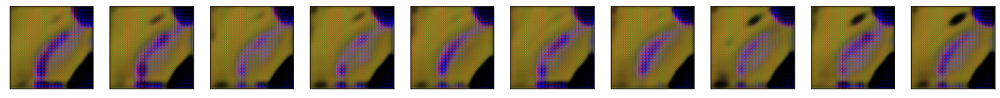

 13%|█▎        | 27/201 [26:57<2:51:57, 59.30s/it]

26 [D loss: 9.633544443804295e-37, accuracy: 100.00] [G loss: 3.442258972785068e-18, G accuracy: 100.00]


 14%|█▍        | 28/201 [27:56<2:50:30, 59.14s/it]

27 [D loss: 1.1731005542969797e-05, accuracy: 100.00] [G loss: 0.00011890810128534213, G accuracy: 100.00]


 14%|█▍        | 29/201 [28:55<2:49:23, 59.09s/it]

28 [D loss: 4.8068097385112196e-05, accuracy: 100.00] [G loss: 0.0004042221698909998, G accuracy: 100.00]


 15%|█▍        | 30/201 [29:54<2:48:27, 59.11s/it]

29 [D loss: 0.002995235612615943, accuracy: 100.00] [G loss: 2.0275614520670615e-09, G accuracy: 100.00]
30 [D loss: 0.0016989378491416574, accuracy: 100.00] [G loss: 0.006545642390847206, G accuracy: 100.00]


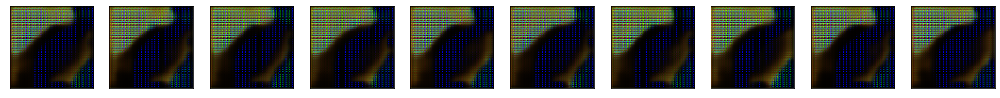

 16%|█▌        | 32/201 [31:55<2:47:49, 59.58s/it]

31 [D loss: 0.001693975762464106, accuracy: 100.00] [G loss: 3.131051868514659e-14, G accuracy: 100.00]


 16%|█▋        | 33/201 [32:54<2:46:51, 59.59s/it]

32 [D loss: 0.03257531300187111, accuracy: 99.00] [G loss: 1.3343726297521119e-11, G accuracy: 100.00]


 17%|█▋        | 34/201 [33:54<2:46:06, 59.68s/it]

33 [D loss: 0.0, accuracy: 100.00] [G loss: 1.0998728241107952e-13, G accuracy: 100.00]


 17%|█▋        | 35/201 [34:53<2:44:26, 59.44s/it]

34 [D loss: 1.6656141681474248e-23, accuracy: 100.00] [G loss: 1.0117952708375103e-29, G accuracy: 100.00]
35 [D loss: 0.0002555368701830082, accuracy: 100.00] [G loss: 0.0016391368117183447, G accuracy: 100.00]


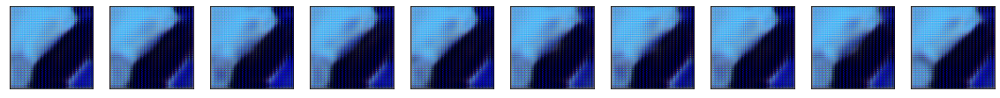

 18%|█▊        | 37/201 [36:52<2:42:23, 59.41s/it]

36 [D loss: 0.0016501691425219178, accuracy: 100.00] [G loss: 0.01103800255805254, G accuracy: 100.00]


 19%|█▉        | 38/201 [37:51<2:41:23, 59.41s/it]

37 [D loss: 1.4629072211391758e-05, accuracy: 100.00] [G loss: 1.1643283869489096e-05, G accuracy: 100.00]


 19%|█▉        | 39/201 [38:50<2:39:49, 59.20s/it]

38 [D loss: 3.2646468753227964e-05, accuracy: 100.00] [G loss: 7.774258847348392e-05, G accuracy: 100.00]


 20%|█▉        | 40/201 [39:49<2:38:55, 59.23s/it]

39 [D loss: 0.001200926722958684, accuracy: 100.00] [G loss: 7.48457651411627e-08, G accuracy: 100.00]
40 [D loss: 0.0007965512340888418, accuracy: 100.00] [G loss: 9.854301995952953e-22, G accuracy: 100.00]


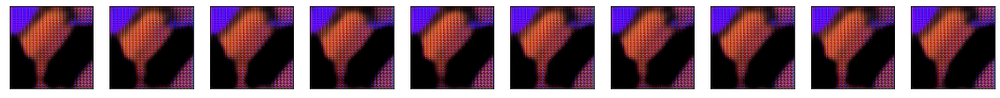

 21%|██        | 42/201 [41:49<2:37:25, 59.41s/it]

41 [D loss: 1.6689923259006752e-12, accuracy: 100.00] [G loss: 33.97769546508789, G accuracy: 0.00]


 21%|██▏       | 43/201 [42:48<2:36:24, 59.39s/it]

42 [D loss: 0.0006631460855714977, accuracy: 100.00] [G loss: 0.0003208755806554109, G accuracy: 100.00]


 22%|██▏       | 44/201 [43:48<2:35:34, 59.45s/it]

43 [D loss: 14.452052116394043, accuracy: 50.00] [G loss: 30.821083068847656, G accuracy: 0.00]


 22%|██▏       | 45/201 [44:47<2:34:35, 59.46s/it]

44 [D loss: 58.56907272338867, accuracy: 50.00] [G loss: 35.4476318359375, G accuracy: 0.00]
45 [D loss: 117.43299102783203, accuracy: 50.00] [G loss: 190.8176727294922, G accuracy: 0.00]


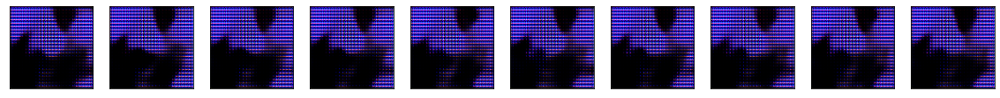

 23%|██▎       | 47/201 [46:46<2:32:45, 59.52s/it]

46 [D loss: 9.689071655273438, accuracy: 50.00] [G loss: 112.09800720214844, G accuracy: 0.00]


 24%|██▍       | 48/201 [47:46<2:31:37, 59.46s/it]

47 [D loss: 70.66429138183594, accuracy: 50.00] [G loss: 119.46421813964844, G accuracy: 0.00]


 24%|██▍       | 49/201 [48:45<2:30:44, 59.50s/it]

48 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 25%|██▍       | 50/201 [49:44<2:29:21, 59.35s/it]

49 [D loss: 1.779941249855256e-25, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
50 [D loss: 15.867077827453613, accuracy: 50.00] [G loss: 149.0394744873047, G accuracy: 0.00]


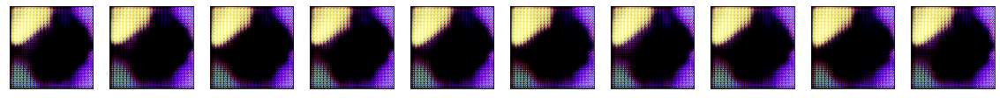

 26%|██▌       | 52/201 [51:44<2:27:38, 59.46s/it]

51 [D loss: 6.256216238398338e-07, accuracy: 100.00] [G loss: 0.0007317311828956008, G accuracy: 100.00]


 26%|██▋       | 53/201 [52:43<2:26:32, 59.41s/it]

52 [D loss: 0.006051616743206978, accuracy: 99.50] [G loss: 0.0, G accuracy: 100.00]


 27%|██▋       | 54/201 [53:42<2:25:15, 59.29s/it]

53 [D loss: 0.00014674181875307113, accuracy: 100.00] [G loss: 0.0004891406279057264, G accuracy: 100.00]


 27%|██▋       | 55/201 [54:41<2:24:07, 59.23s/it]

54 [D loss: 0.0006527844816446304, accuracy: 100.00] [G loss: 4.268514795097156e-14, G accuracy: 100.00]
55 [D loss: 0.005852940492331982, accuracy: 99.50] [G loss: 3.837233620735107e-17, G accuracy: 100.00]


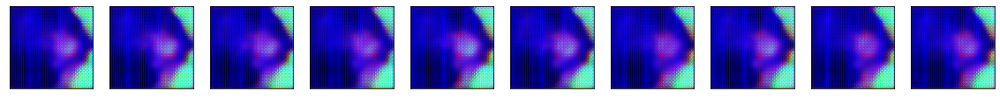

 28%|██▊       | 57/201 [56:41<2:22:50, 59.52s/it]

56 [D loss: 0.00624511856585741, accuracy: 99.50] [G loss: 0.010961172170937061, G accuracy: 100.00]


 29%|██▉       | 58/201 [57:40<2:21:39, 59.44s/it]

57 [D loss: 1.1851235270921023e-10, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 29%|██▉       | 59/201 [58:38<2:19:51, 59.10s/it]

58 [D loss: 674.965087890625, accuracy: 50.00] [G loss: 0.0, G accuracy: 100.00]


 30%|██▉       | 60/201 [59:37<2:18:46, 59.05s/it]

59 [D loss: 7.332443812456304e-23, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
60 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


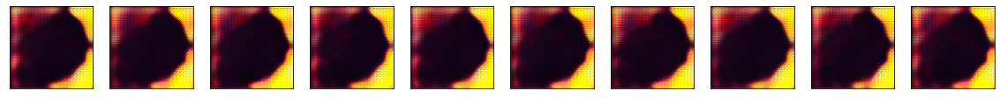

 31%|███       | 62/201 [1:01:36<2:16:56, 59.11s/it]

61 [D loss: 50.35847473144531, accuracy: 50.00] [G loss: 206.38388061523438, G accuracy: 0.00]


 31%|███▏      | 63/201 [1:02:35<2:15:55, 59.10s/it]

62 [D loss: 1.3697422085456878e-09, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 32%|███▏      | 64/201 [1:03:34<2:14:49, 59.05s/it]

63 [D loss: 2.3705838714249694e-07, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 32%|███▏      | 65/201 [1:04:32<2:13:33, 58.92s/it]

64 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
65 [D loss: 1.3184789122624181e-33, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


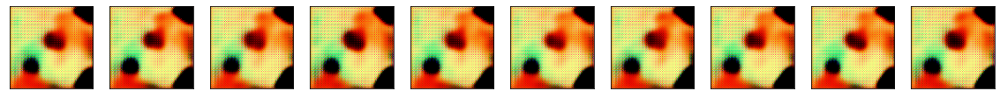

 33%|███▎      | 67/201 [1:06:29<2:11:00, 58.66s/it]

66 [D loss: 0.0, accuracy: 100.00] [G loss: 1.5190040197505144e-35, G accuracy: 100.00]


 34%|███▍      | 68/201 [1:07:28<2:10:05, 58.69s/it]

67 [D loss: 3.2726572953833966e-06, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 34%|███▍      | 69/201 [1:08:27<2:09:25, 58.83s/it]

68 [D loss: 0.00033430338953621686, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 35%|███▍      | 70/201 [1:09:26<2:08:26, 58.83s/it]

69 [D loss: 1.8146870117696778e-10, accuracy: 100.00] [G loss: 0.002490072511136532, G accuracy: 100.00]
70 [D loss: 1.6793091607146625e-30, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


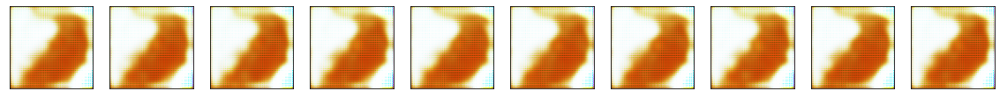

 36%|███▌      | 72/201 [1:11:25<2:07:00, 59.08s/it]

71 [D loss: 3.529352088360582e-10, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 36%|███▋      | 73/201 [1:12:24<2:05:55, 59.03s/it]

72 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 37%|███▋      | 74/201 [1:13:23<2:04:47, 58.95s/it]

73 [D loss: 1.7037057876586914, accuracy: 94.00] [G loss: 72.6707534790039, G accuracy: 0.00]


 37%|███▋      | 75/201 [1:14:21<2:03:39, 58.89s/it]

74 [D loss: 7.394451162490157e-10, accuracy: 100.00] [G loss: 1.5675323011994906e-15, G accuracy: 100.00]
75 [D loss: 0.03358439356088638, accuracy: 98.50] [G loss: 0.0, G accuracy: 100.00]


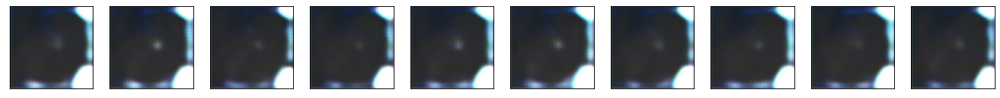

 38%|███▊      | 77/201 [1:16:20<2:01:56, 59.01s/it]

76 [D loss: 9.727171592082657e-29, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 39%|███▉      | 78/201 [1:17:18<2:00:46, 58.92s/it]

77 [D loss: 0.008060629479587078, accuracy: 99.50] [G loss: 0.0, G accuracy: 100.00]


 39%|███▉      | 79/201 [1:18:17<1:59:49, 58.93s/it]

78 [D loss: 4.2762904328697005e-09, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 40%|███▉      | 80/201 [1:19:17<1:58:57, 58.99s/it]

79 [D loss: 4.4628614226469715e-14, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
80 [D loss: 2.291571599144504e-09, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


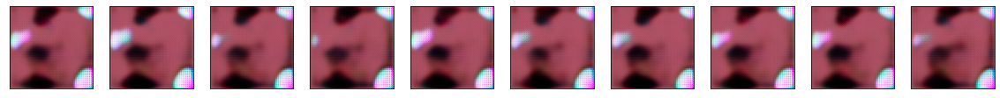

 41%|████      | 82/201 [1:21:16<1:57:29, 59.24s/it]

81 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 41%|████▏     | 83/201 [1:22:15<1:56:13, 59.10s/it]

82 [D loss: 6.107969238655642e-05, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 42%|████▏     | 84/201 [1:23:14<1:55:17, 59.12s/it]

83 [D loss: 61.9840202331543, accuracy: 50.00] [G loss: 616.0914916992188, G accuracy: 0.00]


 42%|████▏     | 85/201 [1:24:12<1:53:49, 58.88s/it]

84 [D loss: 7.87098077686954e-12, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
85 [D loss: 0.12884999997913837, accuracy: 97.50] [G loss: 0.0, G accuracy: 100.00]


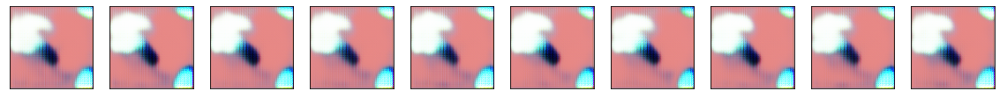

 43%|████▎     | 87/201 [1:26:11<1:52:14, 59.08s/it]

86 [D loss: 0.08889855444431305, accuracy: 98.00] [G loss: 98.54491424560547, G accuracy: 0.00]


 44%|████▍     | 88/201 [1:27:10<1:51:11, 59.04s/it]

87 [D loss: 0.00010472825670149177, accuracy: 100.00] [G loss: 8.365007211162224e-35, G accuracy: 100.00]


 44%|████▍     | 89/201 [1:28:09<1:50:10, 59.02s/it]

88 [D loss: 0.001162853790447116, accuracy: 100.00] [G loss: 7.882256340963067e-07, G accuracy: 100.00]


 45%|████▍     | 90/201 [1:29:08<1:49:28, 59.18s/it]

89 [D loss: 4.968339443206787, accuracy: 90.00] [G loss: 0.0, G accuracy: 100.00]
90 [D loss: 0.011059423070562957, accuracy: 99.50] [G loss: 0.0, G accuracy: 100.00]


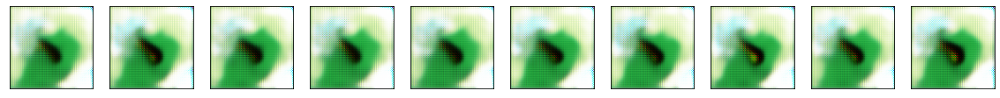

 46%|████▌     | 92/201 [1:31:07<1:47:40, 59.27s/it]

91 [D loss: 3.0585745207750908e-06, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 46%|████▋     | 93/201 [1:32:06<1:46:37, 59.24s/it]

92 [D loss: 2.357456990957886e-19, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 47%|████▋     | 94/201 [1:33:05<1:45:21, 59.08s/it]

93 [D loss: 1.282987341255648e-05, accuracy: 100.00] [G loss: 8.163238206911549e-16, G accuracy: 100.00]


 47%|████▋     | 95/201 [1:34:04<1:44:23, 59.09s/it]

94 [D loss: 2.5099550839513554e-05, accuracy: 100.00] [G loss: 5.967362465878715e-16, G accuracy: 100.00]
95 [D loss: 0.002621443579735351, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


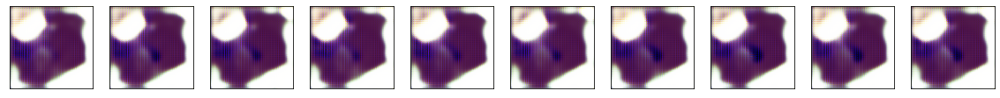

 48%|████▊     | 97/201 [1:36:03<1:42:41, 59.24s/it]

96 [D loss: 1.9627204892522904e-06, accuracy: 100.00] [G loss: 0.04738428443670273, G accuracy: 98.00]


 49%|████▉     | 98/201 [1:37:03<1:41:53, 59.35s/it]

97 [D loss: 5.957008752943693e-08, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 49%|████▉     | 99/201 [1:38:01<1:40:39, 59.21s/it]

98 [D loss: 0.004061423242092133, accuracy: 100.00] [G loss: 1.7510249961105728e-07, G accuracy: 100.00]


 50%|████▉     | 100/201 [1:39:00<1:39:24, 59.05s/it]

99 [D loss: 4.108930443180725e-05, accuracy: 100.00] [G loss: 1.2009009238422852e-11, G accuracy: 100.00]
100 [D loss: 0.11564548314740611, accuracy: 99.50] [G loss: 0.0, G accuracy: 100.00]


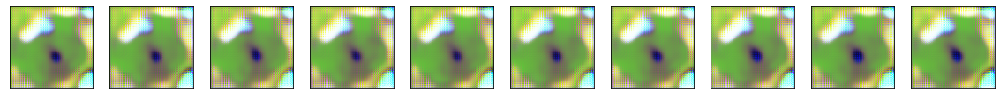

 51%|█████     | 102/201 [1:40:59<1:37:37, 59.17s/it]

101 [D loss: 4.9702193791745264e-06, accuracy: 100.00] [G loss: 0.13169938325881958, G accuracy: 95.00]


 51%|█████     | 103/201 [1:41:58<1:36:26, 59.05s/it]

102 [D loss: 0.00012803042773157358, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 52%|█████▏    | 104/201 [1:42:56<1:35:22, 58.99s/it]

103 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 52%|█████▏    | 105/201 [1:43:55<1:34:18, 58.94s/it]

104 [D loss: 62.208507785818256, accuracy: 50.00] [G loss: 290.4794006347656, G accuracy: 0.00]
105 [D loss: 111.73091888427734, accuracy: 50.00] [G loss: 339.758056640625, G accuracy: 0.00]


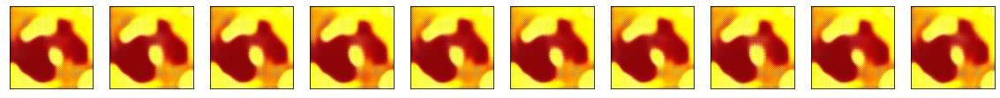

 53%|█████▎    | 107/201 [1:45:54<1:32:31, 59.05s/it]

106 [D loss: 1.0967388108795717e-10, accuracy: 100.00] [G loss: 6.0885132690430804e-24, G accuracy: 100.00]


 54%|█████▎    | 108/201 [1:46:53<1:31:31, 59.05s/it]

107 [D loss: 2.521974010960548e-06, accuracy: 100.00] [G loss: 3.2706382607167813e-16, G accuracy: 100.00]


 54%|█████▍    | 109/201 [1:47:52<1:30:34, 59.07s/it]

108 [D loss: 1.7380560144911575e-24, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 55%|█████▍    | 110/201 [1:48:51<1:29:32, 59.04s/it]

109 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
110 [D loss: 2.5723254637455284e-09, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


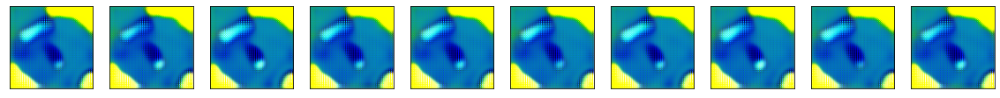

 56%|█████▌    | 112/201 [1:50:50<1:27:53, 59.26s/it]

111 [D loss: 0.0005187503411434591, accuracy: 100.00] [G loss: 7.798255971977949e-32, G accuracy: 100.00]


 56%|█████▌    | 113/201 [1:51:49<1:26:56, 59.28s/it]

112 [D loss: 1.2141726426356803e-12, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 57%|█████▋    | 114/201 [1:52:48<1:25:51, 59.21s/it]

113 [D loss: 0.0001606393198017031, accuracy: 100.00] [G loss: 1.413338474032244e-10, G accuracy: 100.00]


 57%|█████▋    | 115/201 [1:53:47<1:24:49, 59.18s/it]

114 [D loss: 6.690401118720655e-15, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
115 [D loss: 2.968488843180239e-06, accuracy: 100.00] [G loss: 6.593901918474284e-20, G accuracy: 100.00]


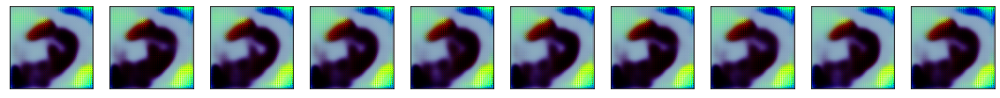

 58%|█████▊    | 117/201 [1:55:46<1:22:48, 59.15s/it]

116 [D loss: 8.535359796724151e-08, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 59%|█████▊    | 118/201 [1:56:45<1:21:46, 59.11s/it]

117 [D loss: 67.02204895019531, accuracy: 50.00] [G loss: 267.842041015625, G accuracy: 0.00]


 59%|█████▉    | 119/201 [1:57:44<1:20:41, 59.04s/it]

118 [D loss: 7.629203082615277e-07, accuracy: 100.00] [G loss: 7.562959986175615e-17, G accuracy: 100.00]


 60%|█████▉    | 120/201 [1:58:43<1:19:37, 58.98s/it]

119 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
120 [D loss: 1.7584093903177944e-10, accuracy: 100.00] [G loss: 6.204345370797171e-11, G accuracy: 100.00]


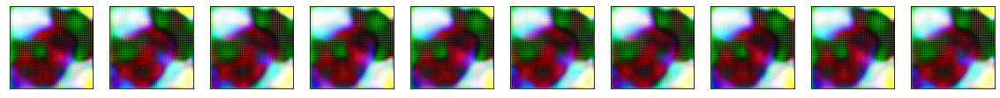

 61%|██████    | 122/201 [2:00:41<1:17:48, 59.10s/it]

121 [D loss: 1.1943909157707822e-05, accuracy: 100.00] [G loss: 5.115123258292442e-08, G accuracy: 100.00]


 61%|██████    | 123/201 [2:01:40<1:16:44, 59.03s/it]

122 [D loss: 0.0015949851367622614, accuracy: 100.00] [G loss: 1.979339202417651e-21, G accuracy: 100.00]


 62%|██████▏   | 124/201 [2:02:39<1:15:46, 59.05s/it]

123 [D loss: 0.0005333388689905405, accuracy: 100.00] [G loss: 0.0004339156439527869, G accuracy: 100.00]


 62%|██████▏   | 125/201 [2:03:39<1:14:56, 59.16s/it]

124 [D loss: 0.001151465461589396, accuracy: 100.00] [G loss: 0.0020750246476382017, G accuracy: 100.00]
125 [D loss: 0.0002209401282016188, accuracy: 100.00] [G loss: 0.003986317664384842, G accuracy: 100.00]


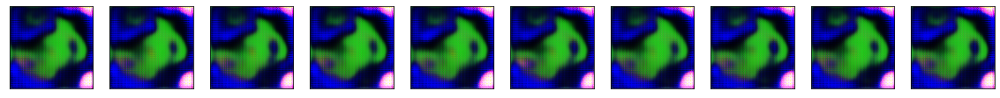

 63%|██████▎   | 127/201 [2:05:38<1:13:13, 59.37s/it]

126 [D loss: 9.49626337387599e-06, accuracy: 100.00] [G loss: 1.4632954136589715e-12, G accuracy: 100.00]


 64%|██████▎   | 128/201 [2:06:37<1:12:00, 59.18s/it]

127 [D loss: 0.000543957925401628, accuracy: 100.00] [G loss: 3.6552488510365275e-23, G accuracy: 100.00]


 64%|██████▍   | 129/201 [2:07:36<1:10:57, 59.14s/it]

128 [D loss: 0.0006687104469165206, accuracy: 100.00] [G loss: 0.0008395384065806866, G accuracy: 100.00]


 65%|██████▍   | 130/201 [2:08:35<1:09:58, 59.13s/it]

129 [D loss: 5.237115943820467e-14, accuracy: 100.00] [G loss: 0.42602086067199707, G accuracy: 94.00]
130 [D loss: 1.1271725933919124e-35, accuracy: 100.00] [G loss: 1.3197610864400244e-13, G accuracy: 100.00]


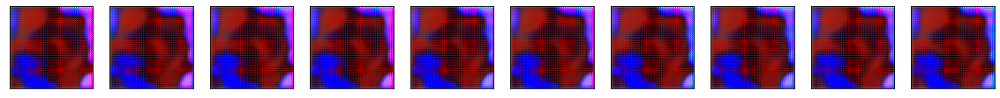

 66%|██████▌   | 132/201 [2:10:33<1:08:03, 59.18s/it]

131 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 66%|██████▌   | 133/201 [2:11:32<1:06:58, 59.10s/it]

132 [D loss: 9.393168534654883e-12, accuracy: 100.00] [G loss: 1.0018988847732544, G accuracy: 83.00]


 67%|██████▋   | 134/201 [2:12:31<1:05:58, 59.09s/it]

133 [D loss: 1.8228954346000137e-08, accuracy: 100.00] [G loss: 2.552272893785635e-17, G accuracy: 100.00]


 67%|██████▋   | 135/201 [2:13:31<1:05:06, 59.19s/it]

134 [D loss: 43.63258743286133, accuracy: 50.00] [G loss: 30.709482192993164, G accuracy: 0.00]
135 [D loss: 0.0, accuracy: 100.00] [G loss: 1.126772354348611e-13, G accuracy: 100.00]


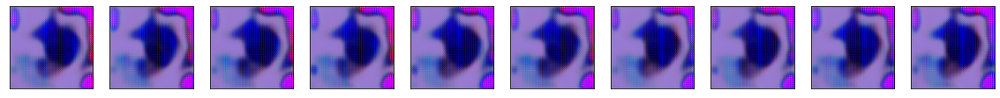

 68%|██████▊   | 137/201 [2:15:30<1:03:24, 59.44s/it]

136 [D loss: 0.0025118740741163492, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 69%|██████▊   | 138/201 [2:16:29<1:02:19, 59.35s/it]

137 [D loss: 5.141096591949463, accuracy: 74.00] [G loss: 3.4034857061638013e-34, G accuracy: 100.00]


 69%|██████▉   | 139/201 [2:17:28<1:01:12, 59.24s/it]

138 [D loss: 7.0835906029742546e-09, accuracy: 100.00] [G loss: 2.046820668510918e-07, G accuracy: 100.00]


 70%|██████▉   | 140/201 [2:18:27<1:00:07, 59.13s/it]

139 [D loss: 2.994049778069774e-13, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
140 [D loss: 0.18247222900390625, accuracy: 98.00] [G loss: 0.0, G accuracy: 100.00]


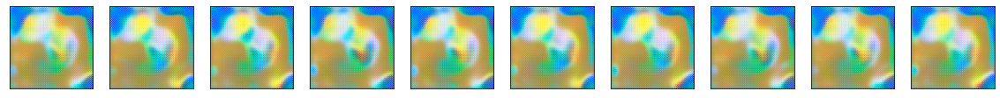

 71%|███████   | 142/201 [2:20:26<58:13, 59.21s/it]  

141 [D loss: 1.439963818917293e-16, accuracy: 100.00] [G loss: 9.73756532421284e-21, G accuracy: 100.00]


 71%|███████   | 143/201 [2:21:25<57:16, 59.25s/it]

142 [D loss: 0.0005288481479510665, accuracy: 100.00] [G loss: 5.336367683705975e-36, G accuracy: 100.00]


 72%|███████▏  | 144/201 [2:22:24<56:15, 59.22s/it]

143 [D loss: 0.0022288314066827297, accuracy: 100.00] [G loss: 0.0071269250474870205, G accuracy: 100.00]


 72%|███████▏  | 145/201 [2:23:23<55:12, 59.16s/it]

144 [D loss: 0.0009575651492924096, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
145 [D loss: 2.8318956537987106e-05, accuracy: 100.00] [G loss: 0.002067804802209139, G accuracy: 100.00]


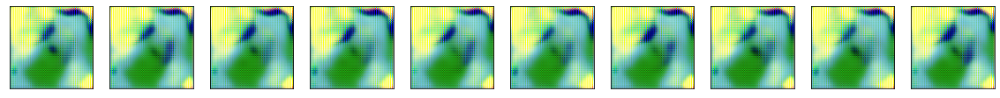

 73%|███████▎  | 147/201 [2:25:22<53:17, 59.21s/it]

146 [D loss: 4.256564352544956e-05, accuracy: 100.00] [G loss: 5.177700224812251e-15, G accuracy: 100.00]


 74%|███████▎  | 148/201 [2:26:21<52:15, 59.17s/it]

147 [D loss: 0.0008436768548563123, accuracy: 100.00] [G loss: 4.0388357443275134e-19, G accuracy: 100.00]


 74%|███████▍  | 149/201 [2:27:20<51:17, 59.18s/it]

148 [D loss: 1.1540163848490456e-15, accuracy: 100.00] [G loss: 1.1905690927202473e-25, G accuracy: 100.00]


 75%|███████▍  | 150/201 [2:28:19<50:18, 59.19s/it]

149 [D loss: 9.256911106396374e-14, accuracy: 100.00] [G loss: 22.346921920776367, G accuracy: 0.00]
150 [D loss: 40.338409423828125, accuracy: 50.00] [G loss: 28.058107376098633, G accuracy: 0.00]


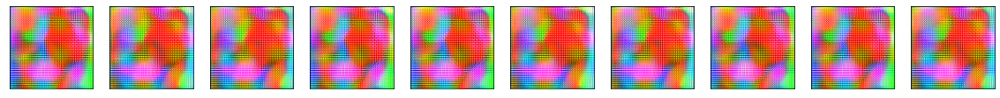

 76%|███████▌  | 152/201 [2:30:18<48:13, 59.05s/it]

151 [D loss: 0.00039733012090437114, accuracy: 100.00] [G loss: 5.9739675229222855e-15, G accuracy: 100.00]


 76%|███████▌  | 153/201 [2:31:17<47:23, 59.23s/it]

152 [D loss: 0.0011086068116128445, accuracy: 100.00] [G loss: 0.007103321608155966, G accuracy: 100.00]


 77%|███████▋  | 154/201 [2:32:17<46:26, 59.29s/it]

153 [D loss: 2.6262164283252787e-06, accuracy: 100.00] [G loss: 0.0006565347430296242, G accuracy: 100.00]


 77%|███████▋  | 155/201 [2:33:16<45:24, 59.23s/it]

154 [D loss: 0.0002640568418428304, accuracy: 100.00] [G loss: 5.754283334546972e-12, G accuracy: 100.00]
155 [D loss: 0.0009209077688865364, accuracy: 100.00] [G loss: 0.0032135113142430782, G accuracy: 100.00]


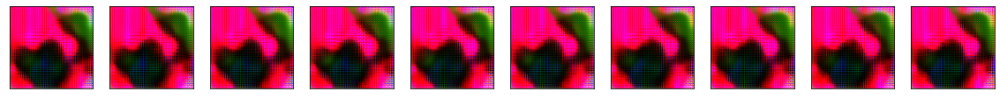

 78%|███████▊  | 157/201 [2:35:15<43:32, 59.38s/it]

156 [D loss: 0.0005005216808058321, accuracy: 100.00] [G loss: 0.0018038994167000055, G accuracy: 100.00]


 79%|███████▊  | 158/201 [2:36:14<42:31, 59.34s/it]

157 [D loss: 2.4275423129438423e-06, accuracy: 100.00] [G loss: 1.7665359634561957e-19, G accuracy: 100.00]


 79%|███████▉  | 159/201 [2:37:13<41:30, 59.29s/it]

158 [D loss: 0.003084025819589442, accuracy: 100.00] [G loss: 7.747127845188933e-32, G accuracy: 100.00]


 80%|███████▉  | 160/201 [2:38:12<40:27, 59.20s/it]

159 [D loss: 0.0004642837470291109, accuracy: 100.00] [G loss: 3.440526401633045e-17, G accuracy: 100.00]
160 [D loss: 8.077075958251957, accuracy: 50.00] [G loss: 55.26707458496094, G accuracy: 0.00]


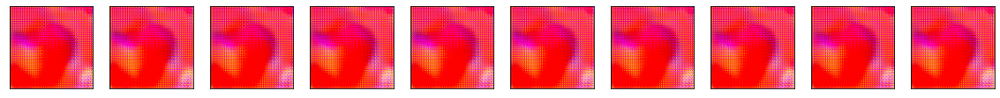

 81%|████████  | 162/201 [2:40:11<38:33, 59.32s/it]

161 [D loss: 0.0019102219957858324, accuracy: 100.00] [G loss: 27.73138999938965, G accuracy: 0.00]


 81%|████████  | 163/201 [2:41:10<37:30, 59.23s/it]

162 [D loss: 0.00011319899931560987, accuracy: 100.00] [G loss: 1.9614842289163574e-36, G accuracy: 100.00]


 82%|████████▏ | 164/201 [2:42:09<36:26, 59.08s/it]

163 [D loss: 0.00044215479284598537, accuracy: 100.00] [G loss: 1.016069704253288e-17, G accuracy: 100.00]


 82%|████████▏ | 165/201 [2:43:08<35:26, 59.08s/it]

164 [D loss: 0.0007269099858149275, accuracy: 100.00] [G loss: 0.00028371490770950913, G accuracy: 100.00]
165 [D loss: 1.842390702222474e-05, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


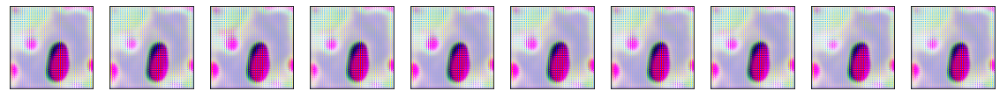

 83%|████████▎ | 167/201 [2:45:07<33:30, 59.14s/it]

166 [D loss: 39.089012145996094, accuracy: 20.50] [G loss: 83.26803588867188, G accuracy: 0.00]


 84%|████████▎ | 168/201 [2:46:06<32:31, 59.12s/it]

167 [D loss: 0.0005213018739596009, accuracy: 100.00] [G loss: 0.0015579848550260067, G accuracy: 100.00]


 84%|████████▍ | 169/201 [2:47:05<31:35, 59.24s/it]

168 [D loss: 0.0007633701898157597, accuracy: 100.00] [G loss: 3.5354670752280656e-22, G accuracy: 100.00]


 85%|████████▍ | 170/201 [2:48:05<30:37, 59.26s/it]

169 [D loss: 6.411836063509367e-29, accuracy: 100.00] [G loss: 103.04015350341797, G accuracy: 0.00]
170 [D loss: 3.193975999238319e-07, accuracy: 100.00] [G loss: 5.583748785923838e-25, G accuracy: 100.00]


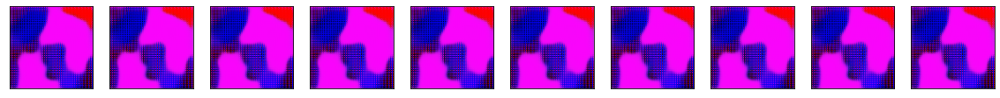

 86%|████████▌ | 172/201 [2:50:04<28:42, 59.40s/it]

171 [D loss: 1.4544610166922212e-05, accuracy: 100.00] [G loss: 9.735597027775792e-32, G accuracy: 100.00]


 86%|████████▌ | 173/201 [2:51:03<27:38, 59.22s/it]

172 [D loss: 0.00018227723194286227, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 87%|████████▋ | 174/201 [2:52:02<26:37, 59.16s/it]

173 [D loss: 0.000416813010815531, accuracy: 100.00] [G loss: 5.541799658059787e-13, G accuracy: 100.00]


 87%|████████▋ | 175/201 [2:53:01<25:40, 59.25s/it]

174 [D loss: 3.140097293297117e-09, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
175 [D loss: 4.630174771591555e-06, accuracy: 100.00] [G loss: 2.503176441102879e-37, G accuracy: 100.00]


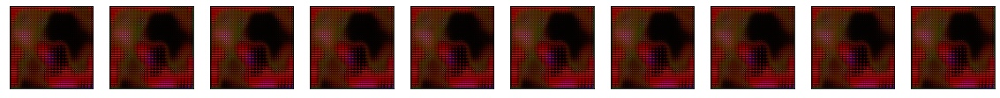

 88%|████████▊ | 177/201 [2:55:00<23:40, 59.21s/it]

176 [D loss: 2.6699937616400024e-34, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 89%|████████▊ | 178/201 [2:55:59<22:40, 59.16s/it]

177 [D loss: 7.718330313248185e-17, accuracy: 100.00] [G loss: 3.2796468712094445e-32, G accuracy: 100.00]


 89%|████████▉ | 179/201 [2:56:58<21:38, 59.04s/it]

178 [D loss: 1.3928862443890466e-05, accuracy: 100.00] [G loss: 1.2202608101051667e-16, G accuracy: 100.00]


 90%|████████▉ | 180/201 [2:57:57<20:42, 59.16s/it]

179 [D loss: 0.0006323356647552584, accuracy: 100.00] [G loss: 6.293990008998662e-05, G accuracy: 100.00]
180 [D loss: 0.0002120558347089382, accuracy: 100.00] [G loss: 0.00047718751011416316, G accuracy: 100.00]


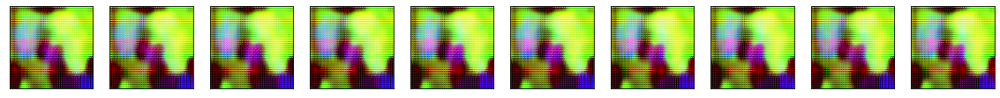

 91%|█████████ | 182/201 [2:59:56<18:46, 59.27s/it]

181 [D loss: 2.0207349734846503e-05, accuracy: 100.00] [G loss: 3.1695293611910813e-10, G accuracy: 100.00]


 91%|█████████ | 183/201 [3:00:55<17:45, 59.20s/it]

182 [D loss: 1.1641812307061628e-05, accuracy: 100.00] [G loss: 4.143310396913915e-34, G accuracy: 100.00]


 92%|█████████▏| 184/201 [3:01:54<16:45, 59.13s/it]

183 [D loss: 4.019594780402258e-05, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 92%|█████████▏| 185/201 [3:02:53<15:46, 59.17s/it]

184 [D loss: 0.0006728991284035146, accuracy: 100.00] [G loss: 0.001505123102106154, G accuracy: 100.00]
185 [D loss: 0.783115565776825, accuracy: 65.00] [G loss: 96.76346588134766, G accuracy: 0.00]


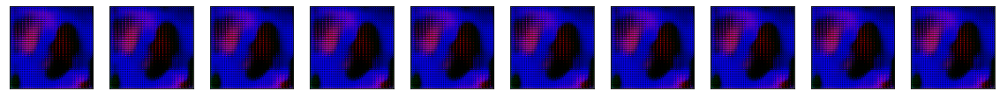

 93%|█████████▎| 187/201 [3:04:52<13:49, 59.26s/it]

186 [D loss: 9.621911658541649e-07, accuracy: 100.00] [G loss: 2.674029531135602e-07, G accuracy: 100.00]


 94%|█████████▎| 188/201 [3:05:51<12:50, 59.23s/it]

187 [D loss: 8.813173735688906e-06, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 94%|█████████▍| 189/201 [3:06:50<11:49, 59.10s/it]

188 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 95%|█████████▍| 190/201 [3:07:49<10:48, 58.97s/it]

189 [D loss: 3.0108750837449194e-32, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]
190 [D loss: 1.215023336424945e-23, accuracy: 100.00] [G loss: 1.5070421157691628e-18, G accuracy: 100.00]


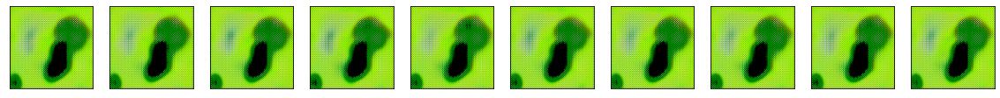

 96%|█████████▌| 192/201 [3:09:47<08:51, 59.03s/it]

191 [D loss: 2.0625397483575267e-24, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 96%|█████████▌| 193/201 [3:10:46<07:52, 59.06s/it]

192 [D loss: 3.7844209145987406e-05, accuracy: 100.00] [G loss: 1.8683280700315663e-07, G accuracy: 100.00]


 97%|█████████▋| 194/201 [3:11:46<06:53, 59.09s/it]

193 [D loss: 8.554283469081987e-36, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 97%|█████████▋| 195/201 [3:12:45<05:54, 59.06s/it]

194 [D loss: 0.00017363516963087022, accuracy: 100.00] [G loss: 2.2660970329543567e-21, G accuracy: 100.00]
195 [D loss: 0.0019542367663234472, accuracy: 100.00] [G loss: 3.9282938544765e-25, G accuracy: 100.00]


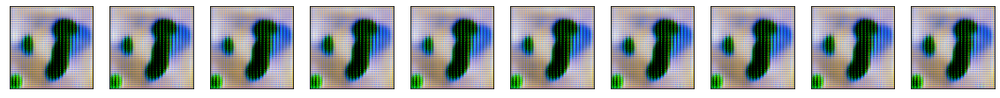

 98%|█████████▊| 197/201 [3:14:44<03:57, 59.27s/it]

196 [D loss: 0.0, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


 99%|█████████▊| 198/201 [3:15:42<02:57, 59.07s/it]

197 [D loss: 1.1149130460282542e-21, accuracy: 100.00] [G loss: 2.661360440470162e-06, G accuracy: 100.00]


 99%|█████████▉| 199/201 [3:16:41<01:58, 59.05s/it]

198 [D loss: 6.379434018919745e-20, accuracy: 100.00] [G loss: 0.0, G accuracy: 100.00]


100%|█████████▉| 200/201 [3:17:40<00:59, 59.09s/it]

199 [D loss: 44.70089340209961, accuracy: 50.50] [G loss: 7.99438500036074e-33, G accuracy: 100.00]
200 [D loss: 0.11963421106338501, accuracy: 99.00] [G loss: 0.0, G accuracy: 100.00]


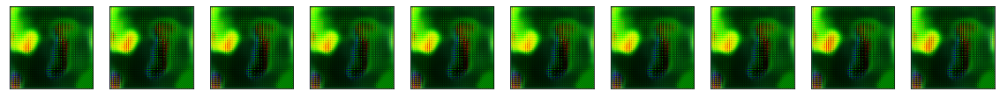

100%|██████████| 201/201 [3:18:40<00:00, 59.31s/it]


In [15]:
epochs = 201
batch_size = 100
sample_interval = 1
ite_to_save = 5
# need to add these for the GPU
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

train(train_gen, df_selected_features, epochs, batch_size, sample_interval, ite_to_save)